In [57]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sys
import geopandas as gpd
import geobr

In [58]:
sys.path.append('..')

In [59]:
list_a = ['0 a 4 anos',
 '5 a 9 anos',
 '10 a 14 anos',
 '15 a 19 anos',
 '20 a 29 anos',
 '30 a 39 anos',
 '40 a 49 anos',
 '50 a 59 anos',
 '60 a 69 anos',
 '70 a 79 anos',
 '80 anos e mais']
list_b = ['A (0, 4]','B (4, 9]','C (9, 14]','D (14, 19]','E (19, 29]','F (29, 39]','G (39, 49]','H (49, 59]','I (59, 69]','J (69, 79]','K (79,120]']
dict_ab = {list_a[i]: list_b[i] for i in range(len(list_a))}

In [60]:
not_path = '../Data/analyzed/not_spatial_year_evo.csv'
res_path = '../Data/analyzed/res_spatial_year_evo.csv'
mun_path = '../Data/age_groups_municipalities.csv'
mun_2_path = '../Data/municipalities.csv'

df_not = pd.read_csv(not_path)
df_res = pd.read_csv(res_path)
mun_file = pd.read_csv(mun_path)
mun_2_file = pd.read_csv(mun_2_path)

In [61]:
mun_file = mun_file.drop(columns = ['Unnamed: 0','Total'])
mun_file = mun_file.set_index('Municipio')

In [62]:
df_not = df_not[['Unnamed: 0', 'ANO_EPI', 'ID_MUNICIP', '(0, 4]', '(4, 9]', '(9, 14]', '(14, 19]', '(19, 29]',
       '(29, 39]', '(39, 49]', '(49, 59]', '(59, 69]', '(69, 79]',
       '(79, 120]', 'TOTAL']]

df_res = df_res[['Unnamed: 0', 'ANO_EPI', 'ID_MN_RESI', '(0, 4]', '(4, 9]', '(9, 14]', '(14, 19]', '(19, 29]',
       '(29, 39]', '(39, 49]', '(49, 59]', '(59, 69]', '(69, 79]',
       '(79, 120]', 'TOTAL']]


In [63]:
df_not = df_not.drop(columns = ['Unnamed: 0','TOTAL'])
df_res = df_res.drop(columns = ['Unnamed: 0','TOTAL'])

In [49]:
map_br = geobr.read_municipality()

In [64]:
map_br['code_muni'] = map_br['code_muni'].astype(str).str[:6].astype(int)

## Based on municipality of notification

C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in geom:
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\descartes\patch.py:62: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  vertices = concatenate([
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\descartes\patch.py:64: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  [asarray(r)[:, :2] for r in t.interiors])
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning: Iteration over mu

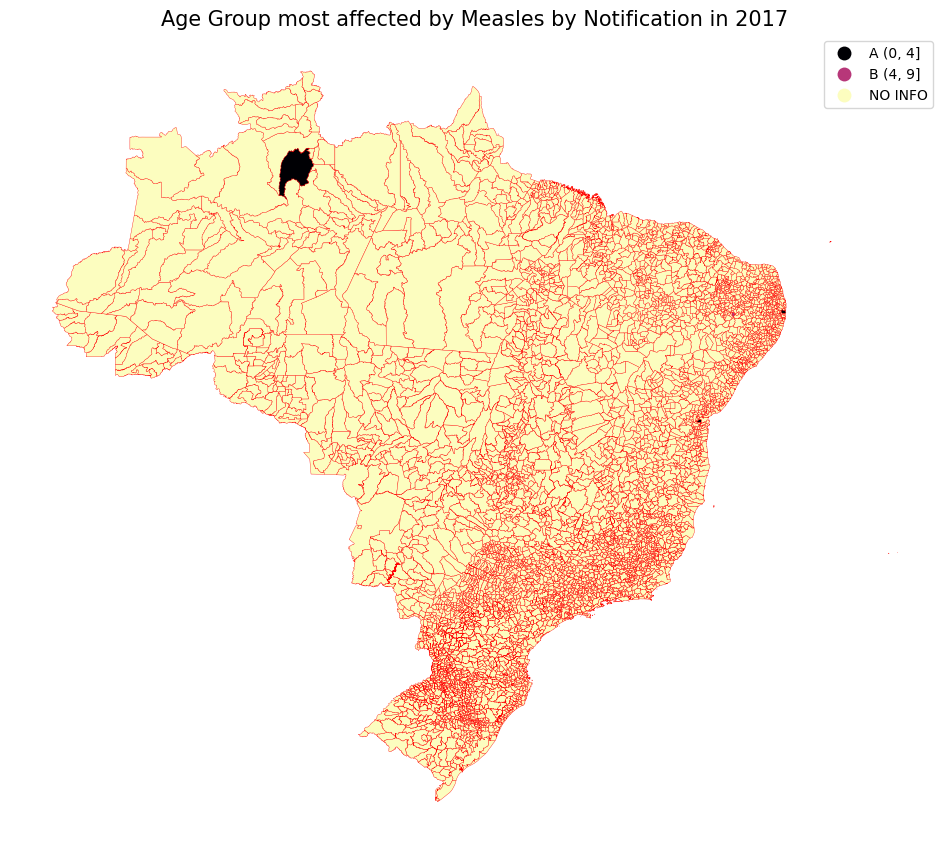

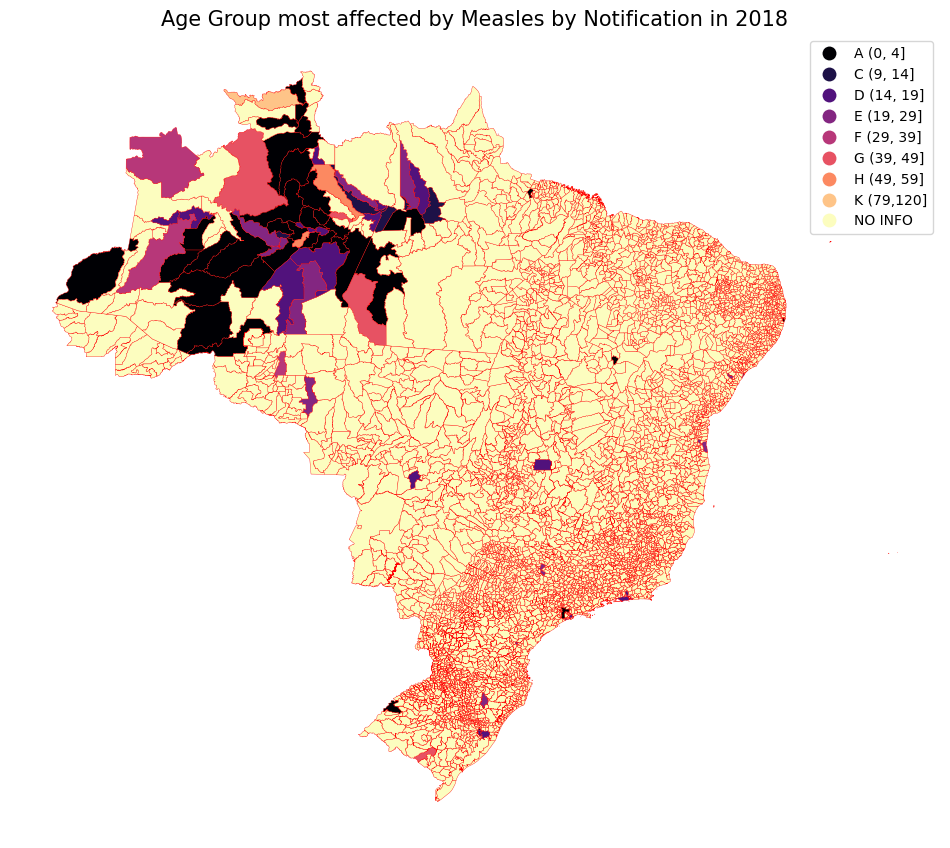

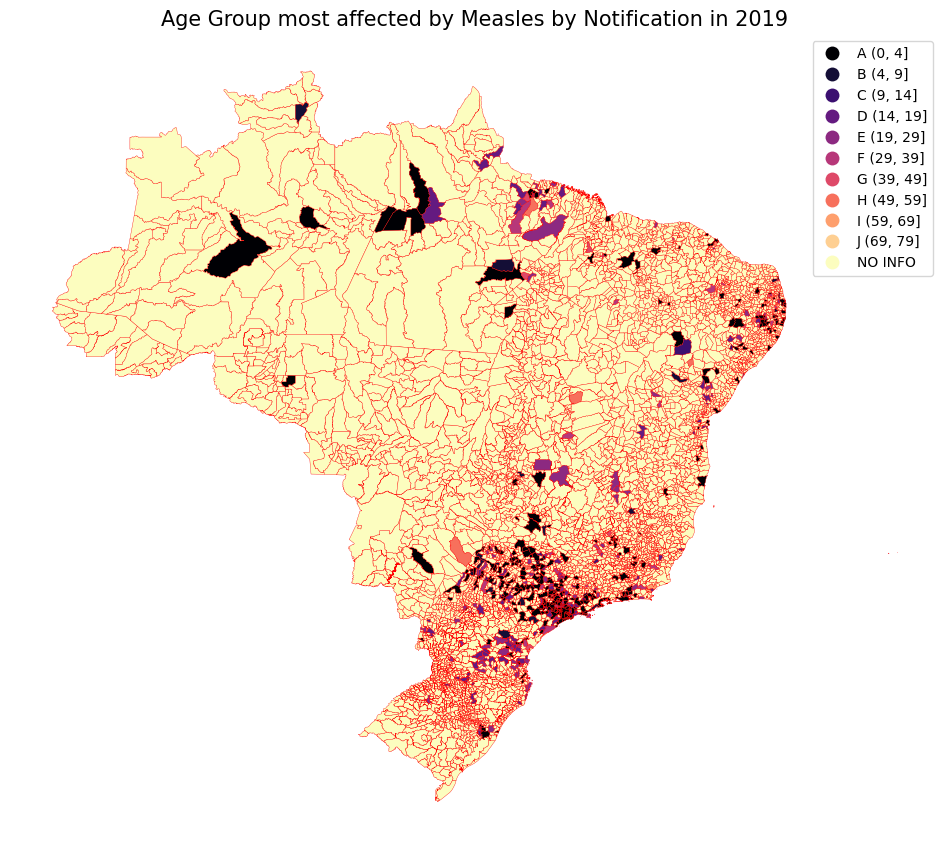

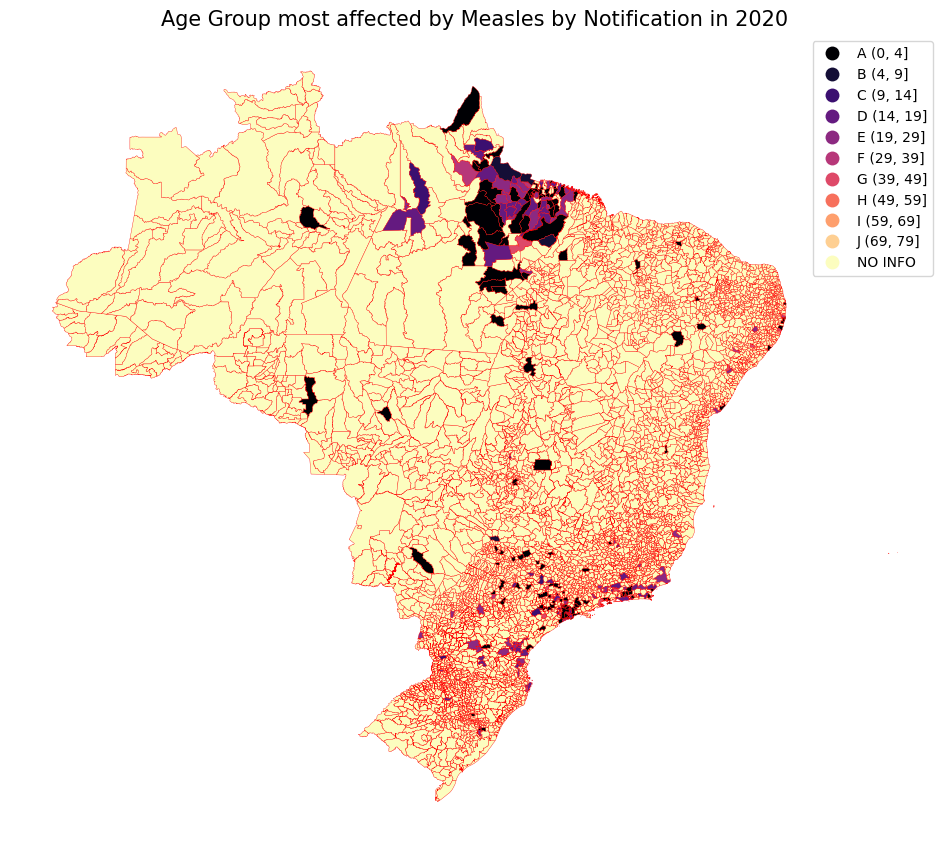

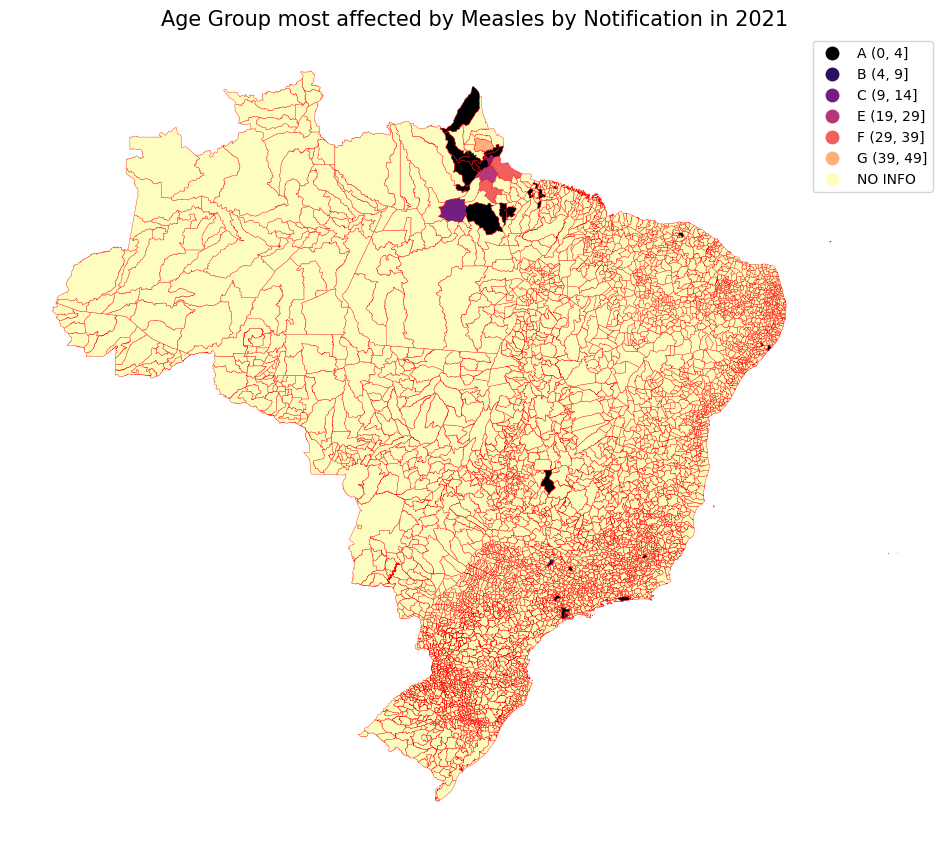

In [65]:
years = [2017,2018,2019,2020,2021]
for year in years:
    df_not_aux = df_not.copy()
    df_not_aux = df_not_aux[df_not_aux['ANO_EPI'] == year]
    df_not_aux = df_not_aux.drop(columns = ['ANO_EPI'])
    df_not_aux = df_not_aux.set_index('ID_MUNICIP')
    df_not_aux.columns = mun_file.columns
    df_not_aux = (df_not_aux/mun_file)*(10**5)
    df_not_aux = df_not_aux.fillna(0)
    df_not_aux = df_not_aux.reset_index()
    df_not_aux['ID_MUNICIP'] = df_not_aux['index']
    df_not_aux = df_not_aux.drop(columns = ['index'])
    df_not_aux = df_not_aux[['ID_MUNICIP','0 a 4 anos', '5 a 9 anos', '10 a 14 anos', '15 a 19 anos',
       '20 a 29 anos', '30 a 39 anos', '40 a 49 anos', '50 a 59 anos',
       '60 a 69 anos', '70 a 79 anos', '80 anos e mais']]
    df_not_aux = df_not_aux.melt(id_vars=["ID_MUNICIP"], 
        var_name="AGE_GROUP", 
        value_name="CASES")
    
    df_not_aux = df_not_aux.sort_values(['ID_MUNICIP','CASES'], ascending=False).drop_duplicates('ID_MUNICIP').sort_index()
    df_not_aux = df_not_aux[df_not_aux['CASES'] != 0]
    map_br_aux = map_br.copy()
    map_br_aux = map_br_aux.merge(df_not_aux, how = 'left', left_on = 'code_muni', right_on = 'ID_MUNICIP')
    map_br_aux = map_br_aux.fillna('NO INFO')
    map_br_aux['AGE_GROUP_2'] = map_br_aux['AGE_GROUP'].replace(dict_ab)
    fig, axs = plt.subplots(figsize = (12,12))
    map_br_aux.plot(
        ax=axs, # Axis de destino do gráfico
        column="AGE_GROUP_2", # Coluna com os valores usados para colorir o mapa
        cmap="magma", # Mapa de cores
        edgecolor="red", # Cor dos contornos
        linewidth=0.25, # Espessura dos contornos
        legend = True,
    )
    axs.set_title(
    "Age Group most affected by Measles by Notification in "+str(year),
    fontdict={"fontsize": 15},
    )
    axs.axis("off") 
    plt.savefig('../Figs/age_group_map_not_'+str(year)+'.pdf')

## Based on municipality of residence

C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in geom:
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\descartes\patch.py:62: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  vertices = concatenate([
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\descartes\patch.py:64: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  [asarray(r)[:, :2] for r in t.interiors])
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning: Iteration over mu

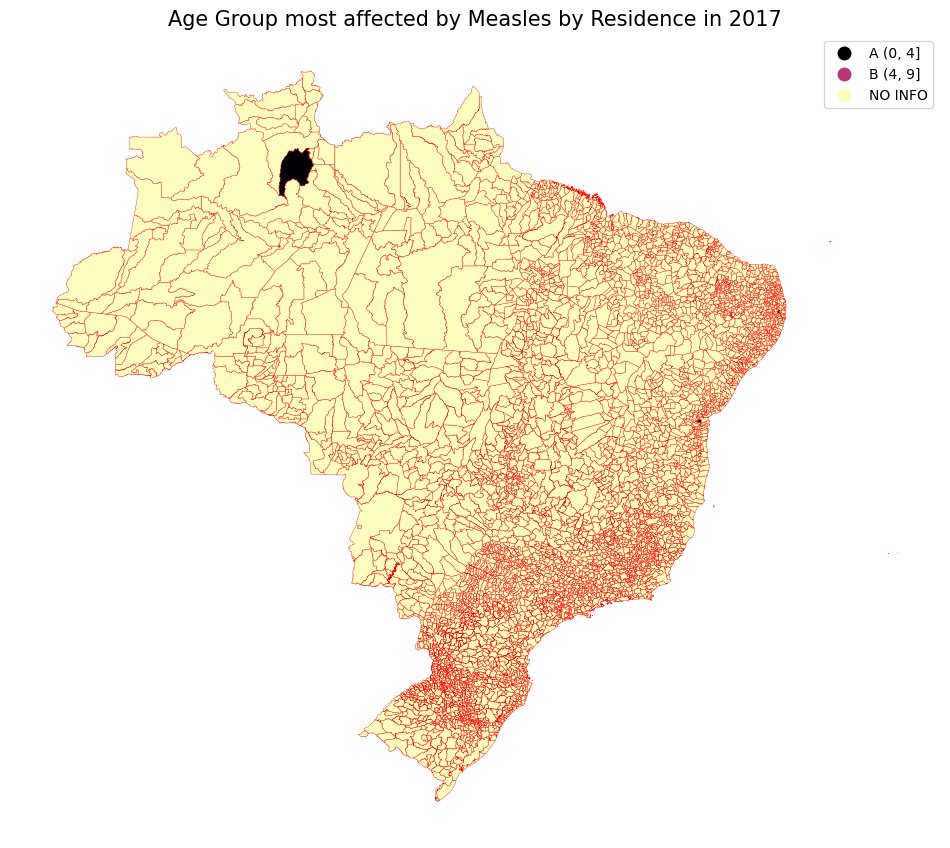

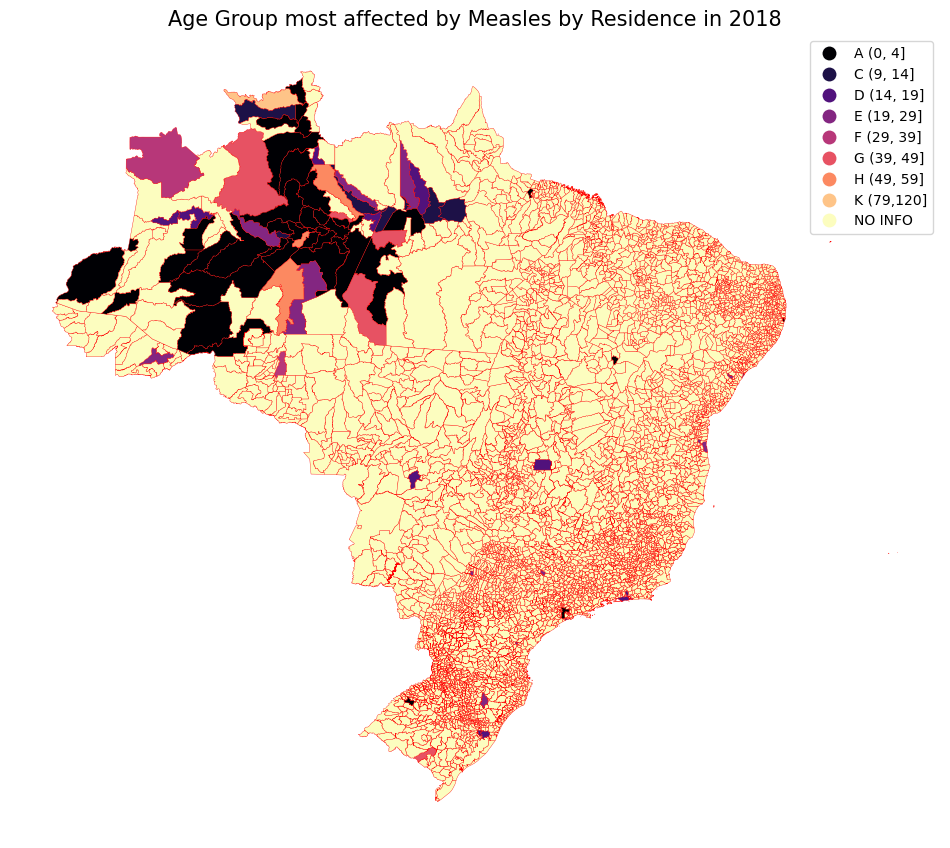

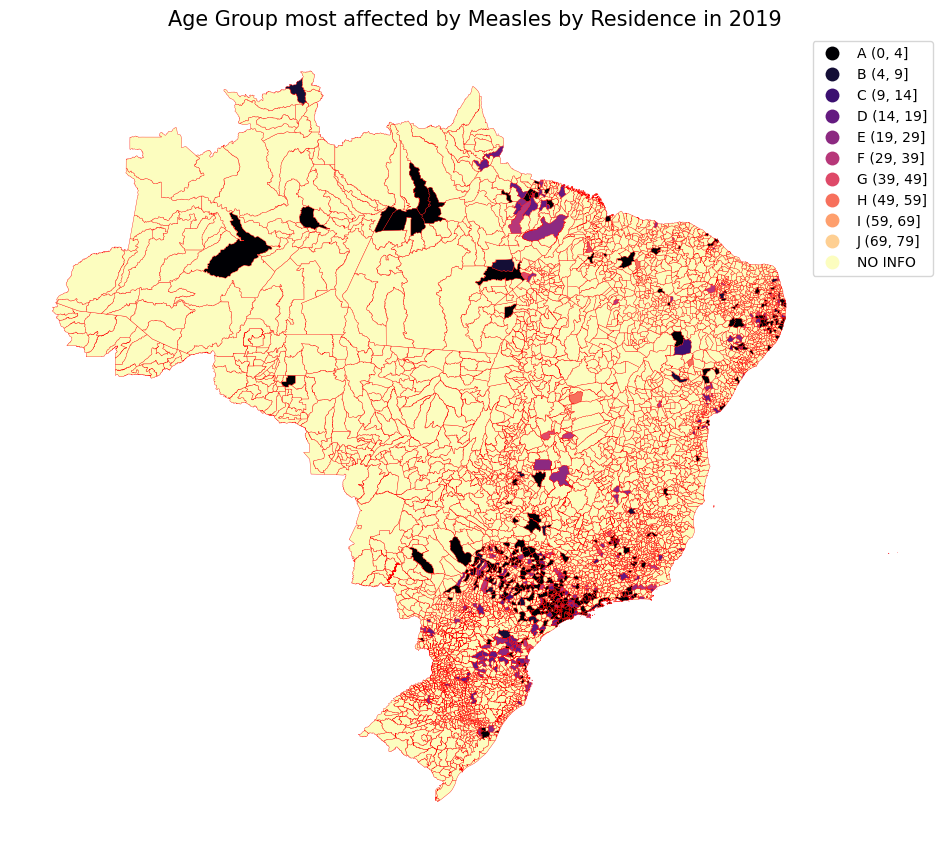

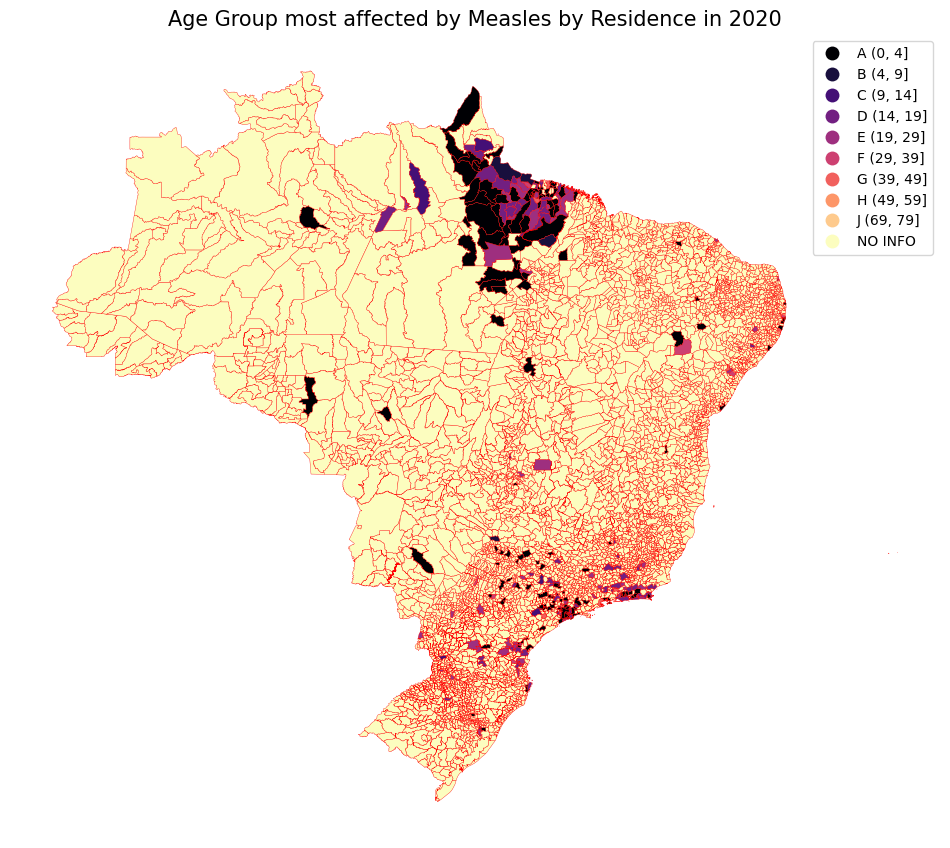

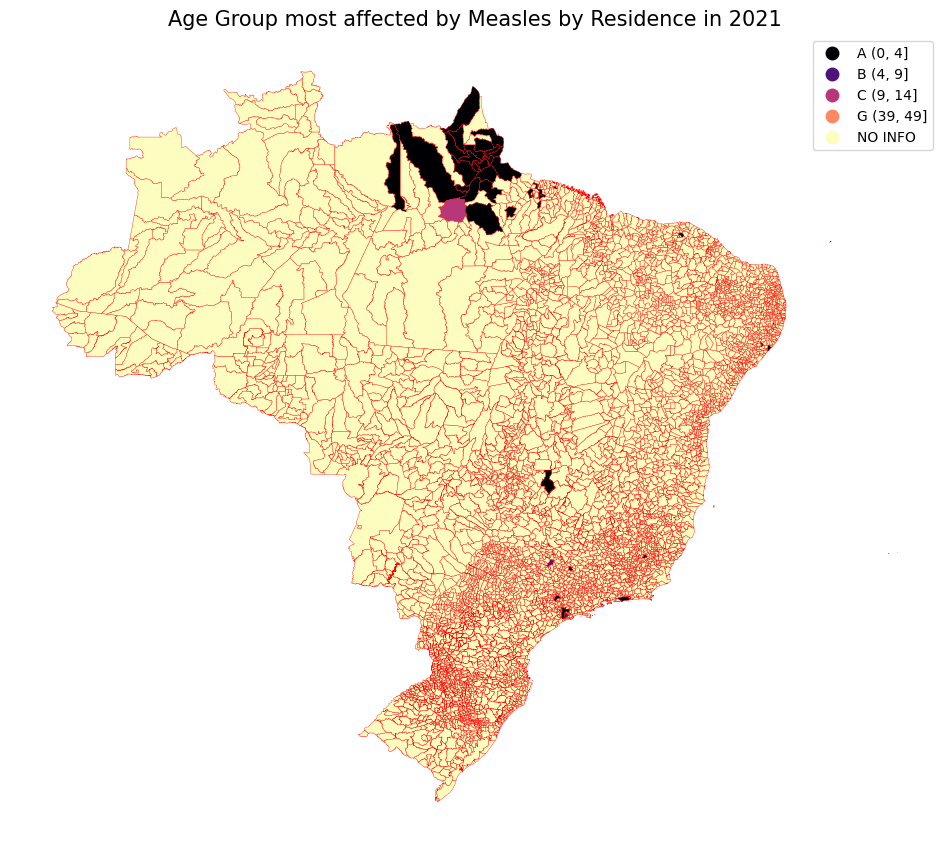

In [66]:
years = [2017,2018,2019,2020,2021]
for year in years:
    df_not_aux = df_res.copy()
    df_not_aux = df_not_aux[df_not_aux['ANO_EPI'] == year]
    df_not_aux = df_not_aux.drop(columns = ['ANO_EPI'])
    df_not_aux = df_not_aux.set_index('ID_MN_RESI')
    df_not_aux.columns = mun_file.columns
    df_not_aux = (df_not_aux/mun_file)*(10**5)
    df_not_aux = df_not_aux.fillna(0)
    df_not_aux = df_not_aux.reset_index()
    df_not_aux['ID_MN_RESI'] = df_not_aux['index']
    df_not_aux = df_not_aux.drop(columns = ['index'])
    df_not_aux = df_not_aux[['ID_MN_RESI','0 a 4 anos', '5 a 9 anos', '10 a 14 anos', '15 a 19 anos',
       '20 a 29 anos', '30 a 39 anos', '40 a 49 anos', '50 a 59 anos',
       '60 a 69 anos', '70 a 79 anos', '80 anos e mais']]
    df_not_aux = df_not_aux.melt(id_vars=["ID_MN_RESI"], 
        var_name="AGE_GROUP", 
        value_name="CASES")
    
    df_not_aux = df_not_aux.sort_values(['ID_MN_RESI','CASES'], ascending=False).drop_duplicates('ID_MN_RESI').sort_index()
    df_not_aux = df_not_aux[df_not_aux['CASES'] != 0]
    map_br_aux = map_br.copy()
    map_br_aux = map_br_aux.merge(df_not_aux, how = 'left', left_on = 'code_muni', right_on = 'ID_MN_RESI')
    map_br_aux = map_br_aux.fillna('NO INFO')
    map_br_aux['AGE_GROUP_2'] = map_br_aux['AGE_GROUP'].replace(dict_ab)
    fig, axs = plt.subplots(figsize = (12,12))
    map_br_aux.plot(
        ax=axs, # Axis de destino do gráfico
        column="AGE_GROUP_2", # Coluna com os valores usados para colorir o mapa
        cmap="magma", # Mapa de cores
        edgecolor="red", # Cor dos contornos
        linewidth=0.25, # Espessura dos contornos
        legend = True,
    )
    axs.set_title(
    "Age Group most affected by Measles by Residence in "+str(year),
    fontdict={"fontsize": 15},
    )
    axs.axis("off") 
    plt.savefig('../Figs/age_group_map_res_'+str(year)+'.pdf')

## Based on municipality of notification - without 0 to 4

C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in geom:
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\descartes\patch.py:62: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  vertices = concatenate([
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\descartes\patch.py:64: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  [asarray(r)[:, :2] for r in t.interiors])
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning: Iteration over mu

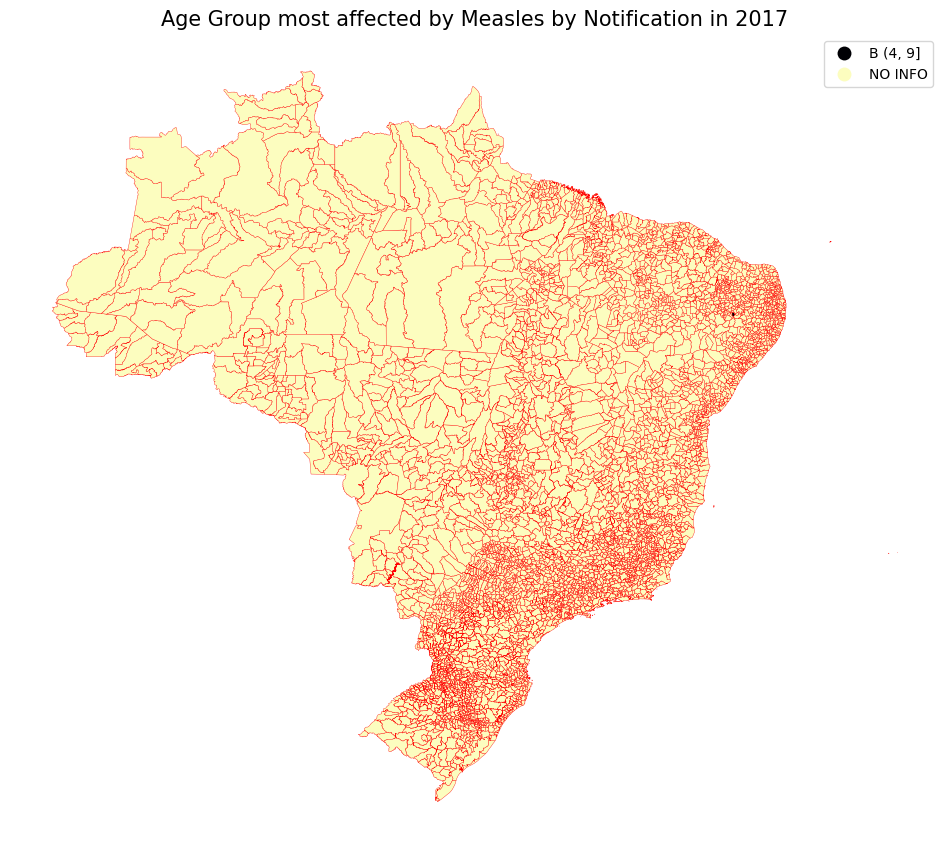

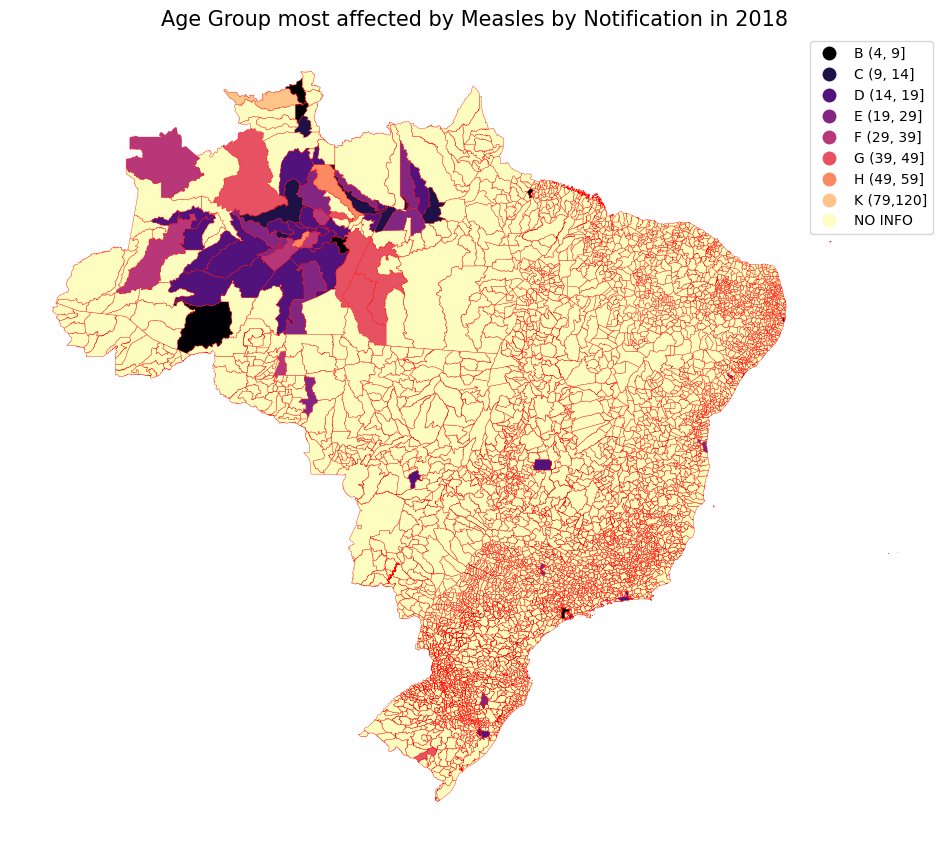

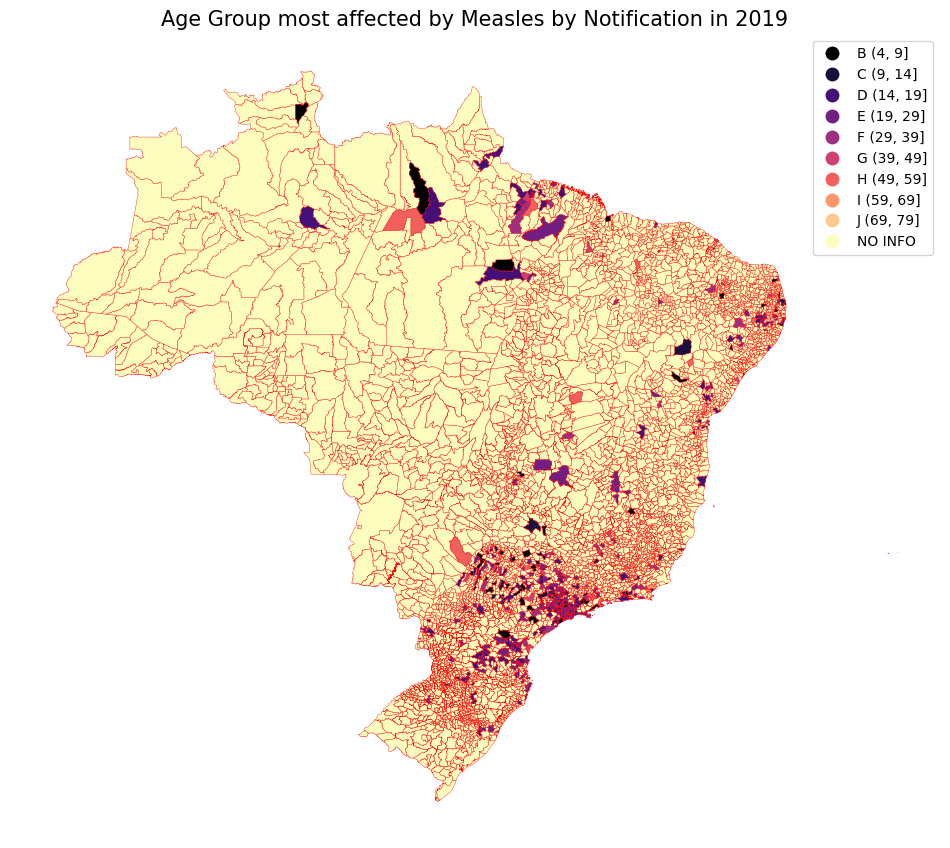

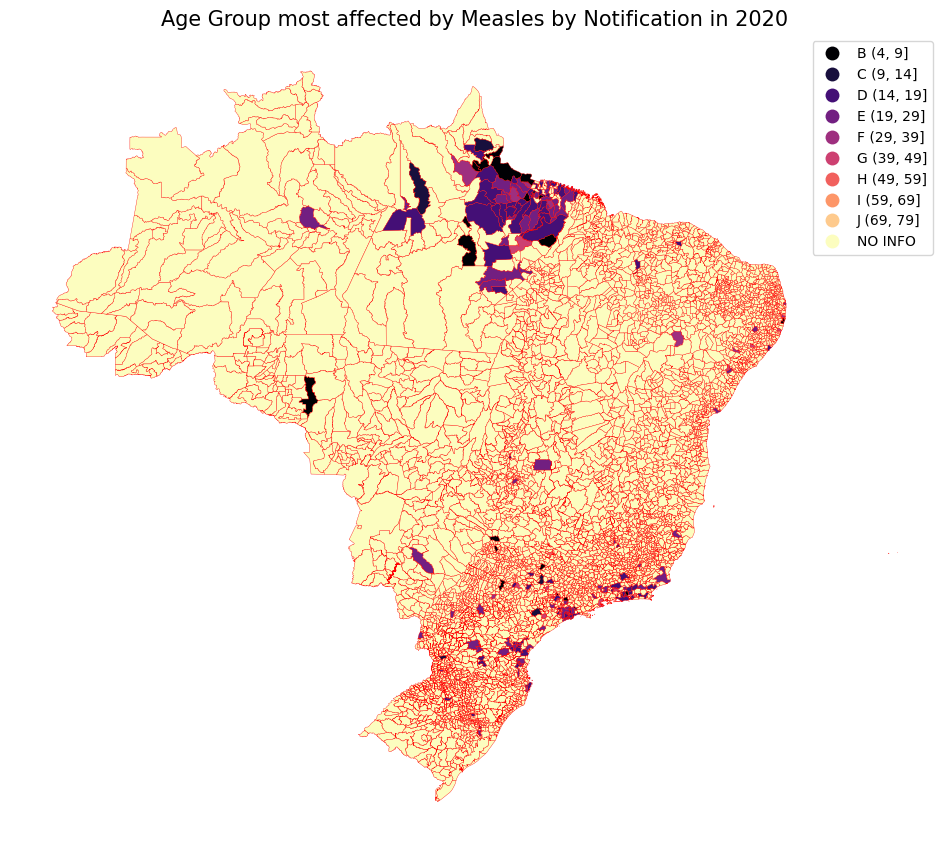

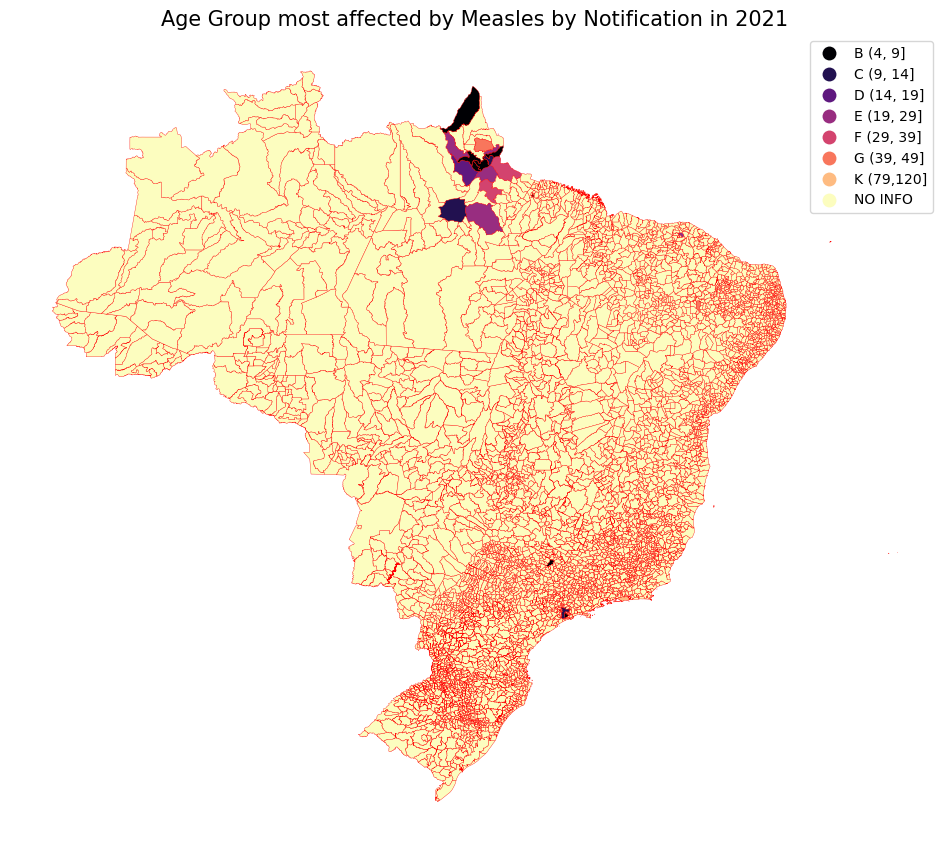

In [67]:
years = [2017,2018,2019,2020,2021]
for year in years:
    df_not_aux = df_not.copy()
    df_not_aux = df_not_aux[df_not_aux['ANO_EPI'] == year]
    df_not_aux = df_not_aux.drop(columns = ['ANO_EPI'])
    df_not_aux = df_not_aux.set_index('ID_MUNICIP')
    df_not_aux.columns = mun_file.columns
    df_not_aux = (df_not_aux/mun_file)*(10**5)
    df_not_aux = df_not_aux.fillna(0)
    df_not_aux = df_not_aux.reset_index()
    df_not_aux['ID_MUNICIP'] = df_not_aux['index']
    df_not_aux = df_not_aux.drop(columns = ['index'])
    df_not_aux = df_not_aux[['ID_MUNICIP','0 a 4 anos', '5 a 9 anos', '10 a 14 anos', '15 a 19 anos',
       '20 a 29 anos', '30 a 39 anos', '40 a 49 anos', '50 a 59 anos',
       '60 a 69 anos', '70 a 79 anos', '80 anos e mais']]
    df_not_aux = df_not_aux.melt(id_vars=["ID_MUNICIP"], 
        var_name="AGE_GROUP", 
        value_name="CASES")
    df_not_aux = df_not_aux[df_not_aux['AGE_GROUP'] != '0 a 4 anos']
    df_not_aux = df_not_aux.sort_values(['ID_MUNICIP','CASES'], ascending=False).drop_duplicates('ID_MUNICIP').sort_index()
    df_not_aux = df_not_aux[df_not_aux['CASES'] != 0]
    map_br_aux = map_br.copy()
    map_br_aux = map_br_aux.merge(df_not_aux, how = 'left', left_on = 'code_muni', right_on = 'ID_MUNICIP')
    map_br_aux = map_br_aux.fillna('NO INFO')
    map_br_aux['AGE_GROUP_2'] = map_br_aux['AGE_GROUP'].replace(dict_ab)
    fig, axs = plt.subplots(figsize = (12,12))
    map_br_aux.plot(
        ax=axs, # Axis de destino do gráfico
        column="AGE_GROUP_2", # Coluna com os valores usados para colorir o mapa
        cmap="magma", # Mapa de cores
        edgecolor="red", # Cor dos contornos
        linewidth=0.25, # Espessura dos contornos
        legend = True,
    )
    axs.set_title(
    "Age Group most affected by Measles by Notification in "+str(year),
    fontdict={"fontsize": 15},
    )
    axs.axis("off") 
    plt.savefig('../Figs/age_group_map_not_2_'+str(year)+'.pdf')

## Based on municipality of residence - without 0 to 4

C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in geom:
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\descartes\patch.py:62: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  vertices = concatenate([
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\descartes\patch.py:64: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  [asarray(r)[:, :2] for r in t.interiors])
C:\Users\denise.cammarota\AppData\Local\anaconda3\lib\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning: Iteration over mu

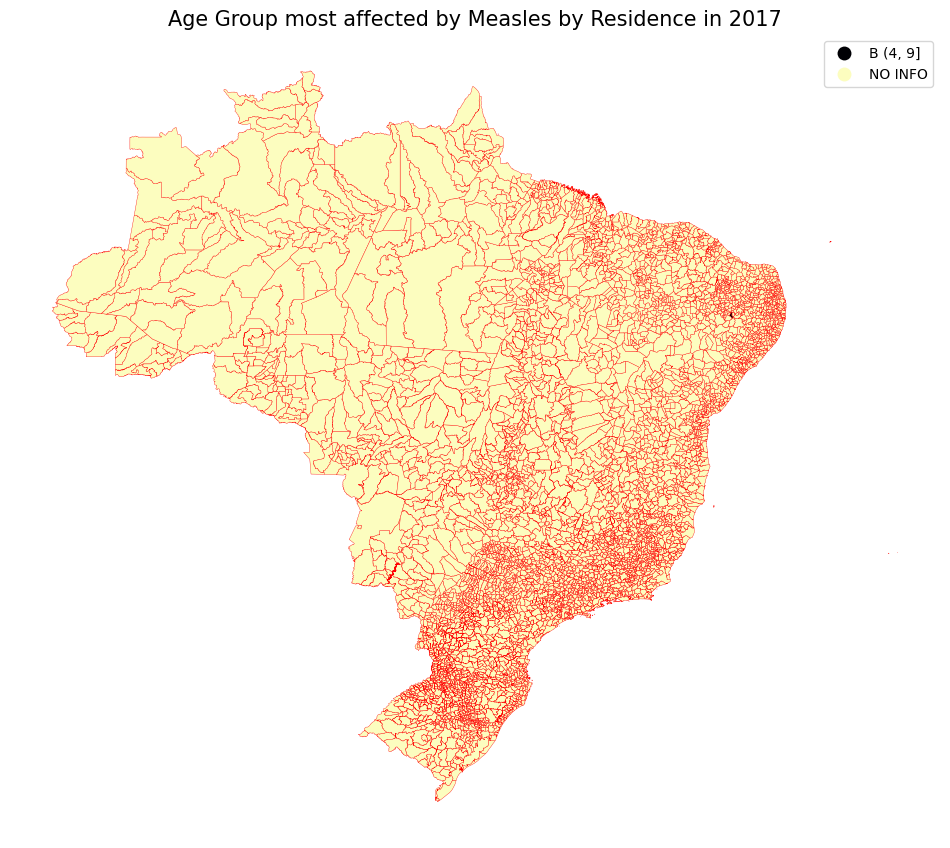

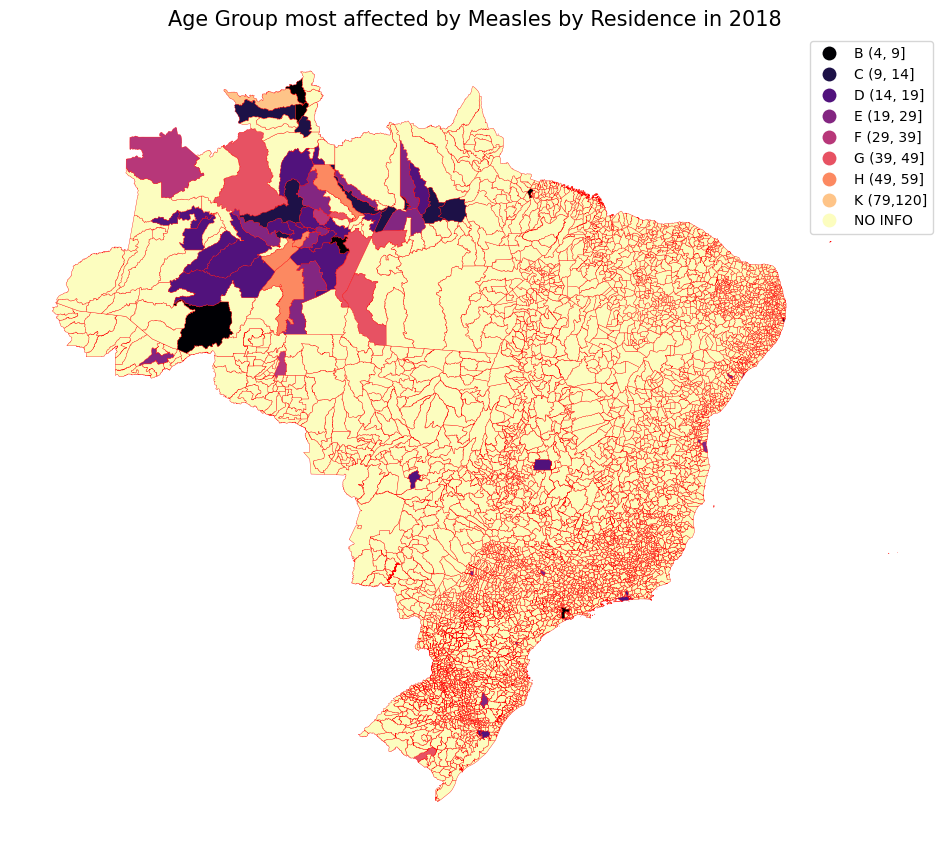

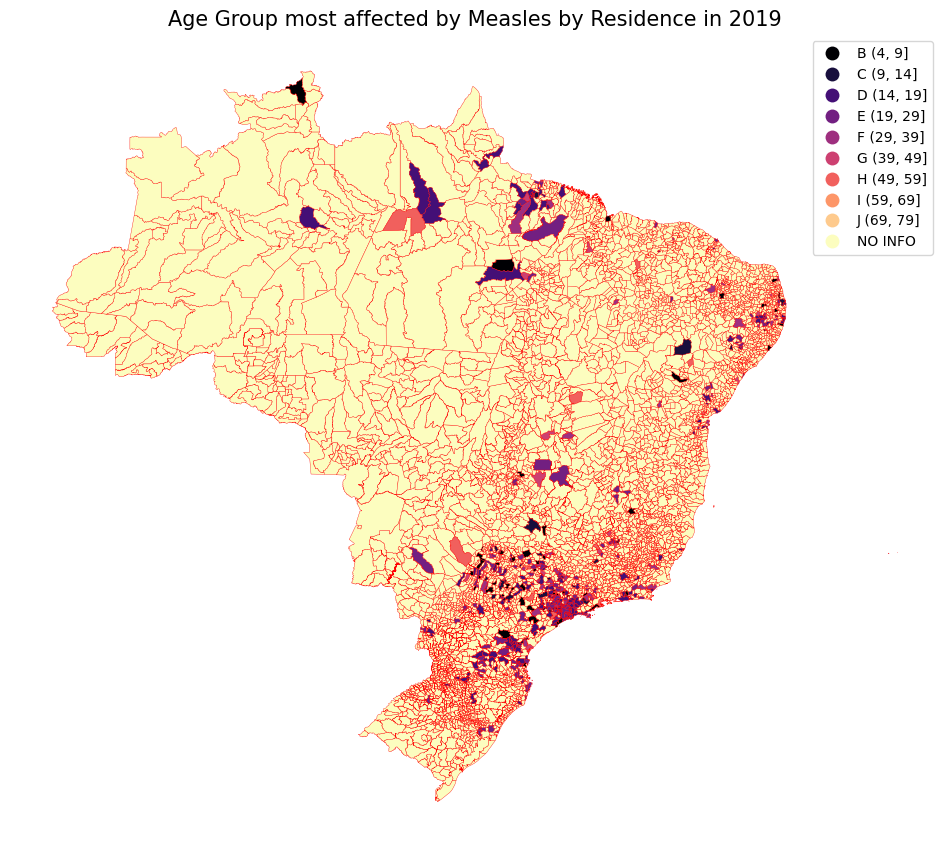

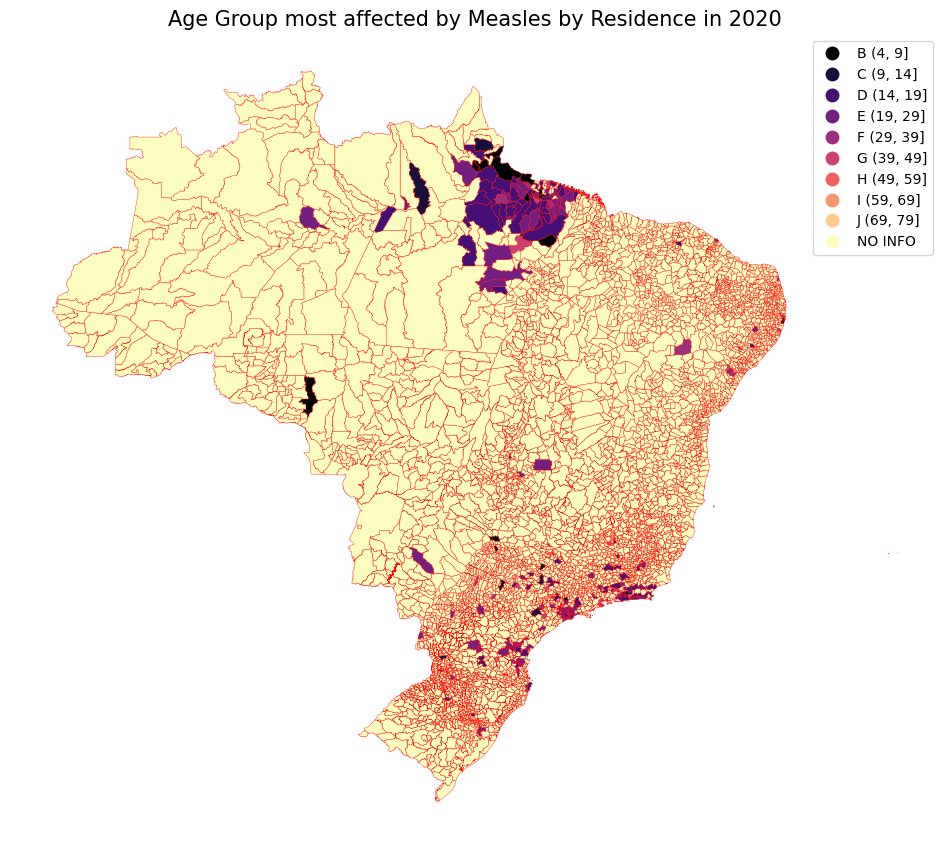

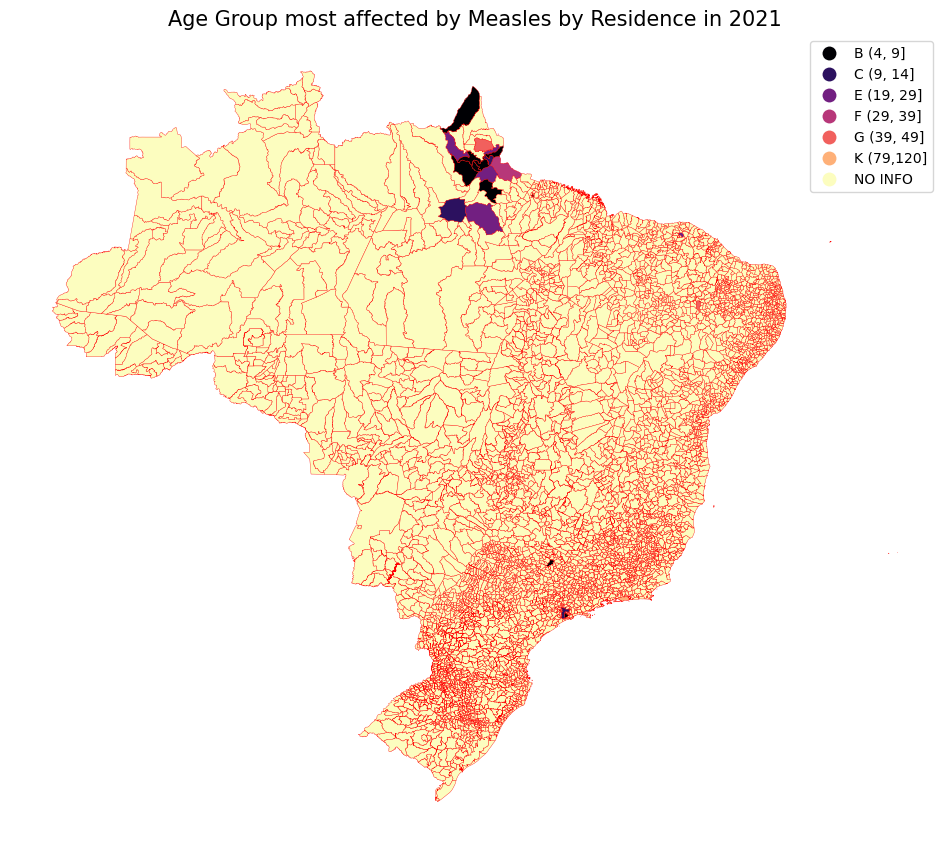

In [68]:
years = [2017,2018,2019,2020,2021]
for year in years:
    df_not_aux = df_res.copy()
    df_not_aux = df_not_aux[df_not_aux['ANO_EPI'] == year]
    df_not_aux = df_not_aux.drop(columns = ['ANO_EPI'])
    df_not_aux = df_not_aux.set_index('ID_MN_RESI')
    df_not_aux.columns = mun_file.columns
    df_not_aux = (df_not_aux/mun_file)*(10**5)
    df_not_aux = df_not_aux.fillna(0)
    df_not_aux = df_not_aux.reset_index()
    df_not_aux['ID_MN_RESI'] = df_not_aux['index']
    df_not_aux = df_not_aux.drop(columns = ['index'])
    df_not_aux = df_not_aux[['ID_MN_RESI','0 a 4 anos', '5 a 9 anos', '10 a 14 anos', '15 a 19 anos',
       '20 a 29 anos', '30 a 39 anos', '40 a 49 anos', '50 a 59 anos',
       '60 a 69 anos', '70 a 79 anos', '80 anos e mais']]
    df_not_aux = df_not_aux.melt(id_vars=["ID_MN_RESI"], 
        var_name="AGE_GROUP", 
        value_name="CASES")
    df_not_aux = df_not_aux[df_not_aux['AGE_GROUP'] != '0 a 4 anos']
    df_not_aux = df_not_aux.sort_values(['ID_MN_RESI','CASES'], ascending=False).drop_duplicates('ID_MN_RESI').sort_index()
    df_not_aux = df_not_aux[df_not_aux['CASES'] != 0]
    map_br_aux = map_br.copy()
    map_br_aux = map_br_aux.merge(df_not_aux, how = 'left', left_on = 'code_muni', right_on = 'ID_MN_RESI')
    map_br_aux = map_br_aux.fillna('NO INFO')
    map_br_aux['AGE_GROUP_2'] = map_br_aux['AGE_GROUP'].replace(dict_ab)
    fig, axs = plt.subplots(figsize = (12,12))
    map_br_aux.plot(
        ax=axs, # Axis de destino do gráfico
        column="AGE_GROUP_2", # Coluna com os valores usados para colorir o mapa
        cmap="magma", # Mapa de cores
        edgecolor="red", # Cor dos contornos
        linewidth=0.25, # Espessura dos contornos
        legend = True,
    )
    axs.set_title(
    "Age Group most affected by Measles by Residence in "+str(year),
    fontdict={"fontsize": 15},
    )
    axs.axis("off") 
    plt.savefig('../Figs/age_group_map_res_2_'+str(year)+'.pdf')